# setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf
from tensorflow import keras
from keras import layers

import numpy as np

import os
import datetime

In [3]:
!wget -q https://github.com/Phonbopit/sarabun-webfont/raw/master/fonts/thsarabunnew-webfont.ttf

In [4]:
import matplotlib as mpl
mpl.font_manager.fontManager.addfont('thsarabunnew-webfont.ttf')
mpl.rc('font', family='TH Sarabun New')

# load data/settings

In [5]:
!cp -r "/content/drive/MyDrive/new_dataset" "/content"

In [6]:
dataset_dir = "/content/new_dataset"

try:
  num_class = len(os.listdir(dataset_dir))
except FileNotFoundError:
  num_class = 4
input_shape = (224, 224, 3)
batch_size = 16

#make dataset

In [ ]:
raise ValueError

from pathlib import Path
import imghdr

# jpg JPG jpeg JPEG
img_link=list(Path("/content/dataset/").glob(r'**/*.JPEG'))

count_num=0
for lnk in img_link:
    binary_img=open(lnk,'rb')
    find_img=tf.compat.as_bytes('JFIF') in binary_img.peek(10)#The JFIF is a JPEG File Interchange Format (JFIF). It is a standard which we gauge if an image is corrupt or substandard
    if not find_img:
        count_num+=1
        os.remove(str(lnk))
print('Total %d pcs image delete from Dataset' % count_num)
#this should help you delete the bad encoded

Total 0 pcs image delete from Dataset


In [ ]:
raise ValueError

for i, folder in enumerate(os.listdir(dataset_dir)):
  dataset_class_dir = os.path.join(dataset_dir, folder)

  for j, picture in enumerate(os.listdir(dataset_class_dir)):
    file_extention = picture.split(".")[-1].lower()
    # JPEG, PNG, GIF, BMP
    if not file_extention in ["jpg", "jpeg", "png"]:
      print(picture)
      os.remove(os.path.join(dataset_class_dir, picture))

In [7]:
!ls -R "/content/new_dataset" | wc -l

2164


In [7]:
data_train, data_val = keras.utils.image_dataset_from_directory(dataset_dir,
                                                   shuffle=True,
                                                   seed=6942,
                                                   batch_size=batch_size,
                                                   image_size=input_shape[0:2],
                                                   label_mode="categorical",
                                                   subset="both",
                                                   validation_split=0.2)

Found 2151 files belonging to 4 classes.
Using 1721 files for training.
Using 430 files for validation.


In [9]:
data_train.save("/content/dataset_train")
data_val.save("/content/dataset_validation")

In [8]:
class_names = data_train.class_names
print(class_names)

['marble', 'not_rock', 'sandstone', 'shale']


In [9]:
import matplotlib.pyplot as plt

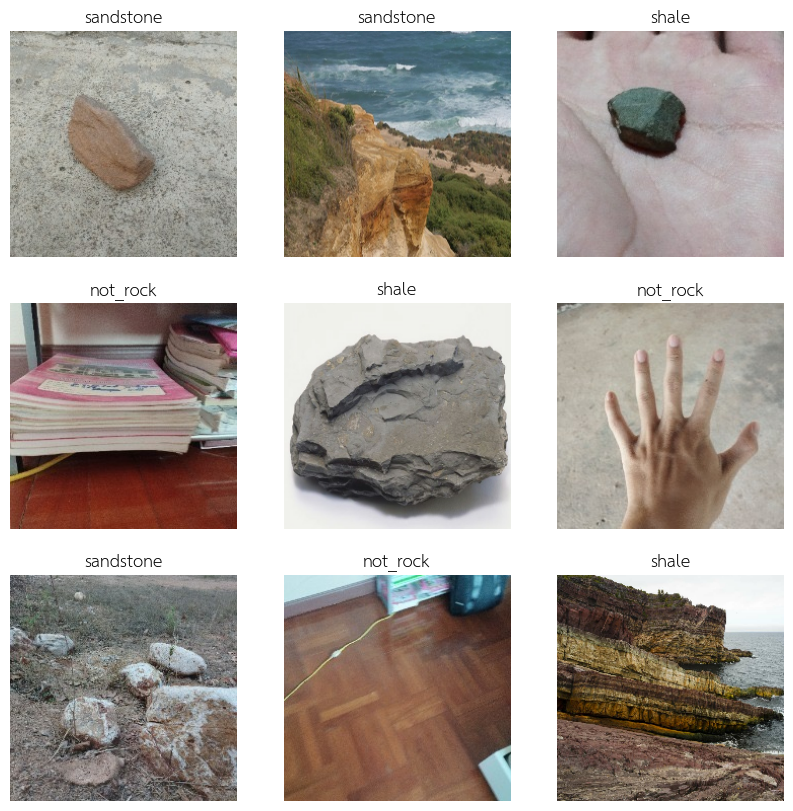

In [10]:
plt.figure(figsize=(10, 10))
for images, labels in data_train.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels.numpy()[i].argmax()])
    plt.axis("off")

#make model

In [11]:
class rock_model(keras.Model):
  def __init__(self):
    super().__init__()

    self.data_augmentation = keras.Sequential([
        layers.RandomFlip("horizontal_and_vertical"),
        layers.RandomRotation(0.4),
        layers.RandomContrast(0.2),
        layers.RandomBrightness(0.2)
        ])

    self.resnet = keras.applications.resnet50.ResNet50(
        include_top=False,
        weights='imagenet'
        )
    
    self.resnet.trainable = False
    
    self.pooling = layers.AveragePooling2D(pool_size=(7, 7))
    self.flatten = layers.Flatten()
    self.dense_1 = layers.Dense(256, activation="relu")
    self.dense_2 = layers.Dense(256, activation="relu")
    self.dropout = layers.Dropout(0.5)

    self.output_layer = layers.Dense(num_class, activation="softmax")

  def call(self, inputs, training=None):
    x = inputs
    
    if training == True:
      x = self.data_augmentation(inputs, training=True)
  
    x = self.resnet(x)
    x = self.pooling(x)
    x = self.flatten(x)
    x = self.dense_1(x)
    x = self.dense_2(x)
    x = self.dropout(x)
    x = self.output_layer(x)

    return x # [0.2, 0.3, 0.1, 0.4] sigma_x = 1



In [12]:
# TODO: test program

In [13]:
model = rock_model()

94765736/94765736 [==============================] - 1s 0us/step


#training

In [14]:
learning_rate = 0.0001

model.compile(optimizer=keras.optimizers.AdamW(learning_rate=learning_rate),
              loss=keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy', "categorical_crossentropy"])

In [ ]:
model.summary()

ValueError: ignored

In [15]:
%load_ext tensorboard

In [ ]:
!rm -rf ./logs/

In [16]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [17]:
%tensorboard --logdir logs/fit

Output hidden; open in https://colab.research.google.com to view.

In [18]:
early_stop = keras.callbacks.EarlyStopping(
    min_delta=0.008,
    patience=5,
    mode="auto",
    verbose=1,
    restore_best_weights=True
)

In [19]:
model.fit(data_train, 
          epochs=100, 
          validation_data=data_val, 
          callbacks=[tensorboard_callback, early_stop])

Epoch 1/100
108/108 [==============================] - 34s 184ms/step - loss: 0.9099 - accuracy: 0.6415 - categorical_crossentropy: 0.9099 - val_loss: 0.5240 - val_accuracy: 0.8023 - val_categorical_crossentropy: 0.5240
Epoch 2/100
108/108 [==============================] - 17s 158ms/step - loss: 0.5677 - accuracy: 0.7914 - categorical_crossentropy: 0.5677 - val_loss: 0.4191 - val_accuracy: 0.8395 - val_categorical_crossentropy: 0.4191
Epoch 3/100
108/108 [==============================] - 17s 158ms/step - loss: 0.4554 - accuracy: 0.8402 - categorical_crossentropy: 0.4554 - val_loss: 0.3711 - val_accuracy: 0.8721 - val_categorical_crossentropy: 0.3711
Epoch 4/100
108/108 [==============================] - 17s 151ms/step - loss: 0.3611 - accuracy: 0.8722 - categorical_crossentropy: 0.3611 - val_loss: 0.3213 - val_accuracy: 0.8744 - val_categorical_crossentropy: 0.3213
Epoch 5/100
108/108 [==============================] - 17s 155ms/step - loss: 0.3096 - accuracy: 0.8844 - categorical_cr

In [35]:
model_2 = keras.models.clone_model(model)

In [37]:
model_2.compile(optimizer=keras.optimizers.AdamW(learning_rate=learning_rate),
               loss=keras.losses.CategoricalCrossentropy(),
               metrics=['accuracy', "categorical_crossentropy"])

In [38]:
model_2.fit(data_train, 
           epochs=1, 
           validation_data=data_val)

108/108 [==============================] - 17s 109ms/step - loss: 0.9513 - accuracy: 0.6200 - categorical_crossentropy: 0.9513 - val_loss: 0.5402 - val_accuracy: 0.7791 - val_categorical_crossentropy: 0.5402


In [39]:
model_2.set_weights(model.get_weights())

In [40]:
model_2.resnet.trainable = True

model_2.fit(data_train, 
           epochs=100, 
           validation_data=data_val, 
           callbacks=[early_stop])

Epoch 1/100
108/108 [==============================] - 11s 97ms/step - loss: 0.1388 - accuracy: 0.9570 - categorical_crossentropy: 0.1388 - val_loss: 0.2920 - val_accuracy: 0.9070 - val_categorical_crossentropy: 0.2920
Epoch 2/100
108/108 [==============================] - 11s 96ms/step - loss: 0.1218 - accuracy: 0.9547 - categorical_crossentropy: 0.1218 - val_loss: 0.3329 - val_accuracy: 0.8953 - val_categorical_crossentropy: 0.3329
Epoch 3/100
108/108 [==============================] - 13s 122ms/step - loss: 0.1176 - accuracy: 0.9570 - categorical_crossentropy: 0.1176 - val_loss: 0.3136 - val_accuracy: 0.9047 - val_categorical_crossentropy: 0.3136
Epoch 4/100
108/108 [==============================] - 13s 118ms/step - loss: 0.1057 - accuracy: 0.9709 - categorical_crossentropy: 0.1057 - val_loss: 0.2745 - val_accuracy: 0.9233 - val_categorical_crossentropy: 0.2745
Epoch 5/100
108/108 [==============================] - 13s 118ms/step - loss: 0.0946 - accuracy: 0.9675 - categorical_cros

In [ ]:
# val_loss: 0.2323 - val_accuracy: 0.9163
# val_loss: 0.2781 - val_accuracy: 0.9116

Predictions:
 [2 3 2 2 2 2 0 0 3 0 2 2 2 2 1 1]
Labels:
 [2 3 2 2 2 2 0 0 3 0 2 2 2 2 1 3]


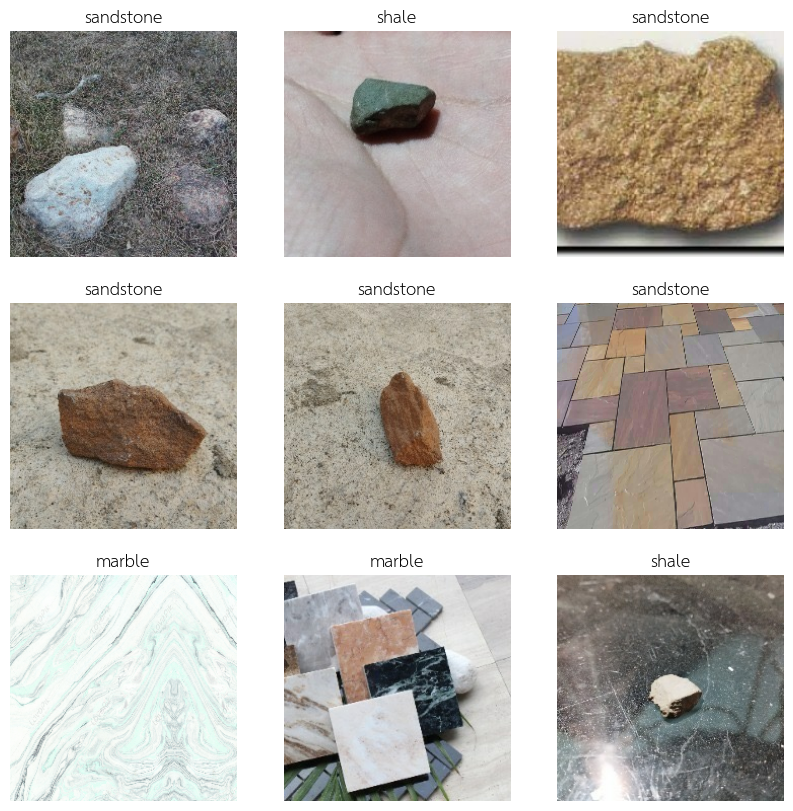

In [41]:
# Retrieve a batch of images from the test set
image_batch, label_batch = data_val.as_numpy_iterator().next()

## model_2
predictions = model_2.predict_on_batch(image_batch)

# Apply a sigmoid since our model returns logits

print('Predictions:\n', predictions.argmax(axis=1))
print('Labels:\n', label_batch.argmax(axis=1))

plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i].astype("uint8"))
  plt.title(class_names[predictions[i].argmax()])
  plt.axis("off")

In [53]:
# keras.backend.eval(tf.math.argmax(tf.constant([0.1, 0.2, 0.3])))

2

In [58]:
class RockResnet(tf.Module):
  def __init__(self, resnet_model, label, input_shape=(224, 224, 3)):
    self.resnet_model = resnet_model
    self.input_shape = input_shape
    self.label = label

  def __call__(self, image_tensor):
    assert image_tensor.shape == self.input_shape

    prediction = self.resnet_model(tf.reshape(image_tensor, 
                                              (1, self.input_shape[0],
                                              self.input_shape[1],
                                              self.input_shape[2])))
    
    return prediction, self.label

In [59]:
test = RockResnet(model_2, class_names)

In [60]:
class ExportModel(tf.Module):
  def __init__(self, model):
    self.model = model

  @tf.function(input_signature=[tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32)])
  def __call__(self, picture_array):
    (prediction, label) = self.model(picture_array)

    return prediction, label

In [61]:
export_model = ExportModel(test)

tf.saved_model.save(export_model, export_dir='rock_resnet_model_91')

In [62]:
reloaded = tf.saved_model.load("rock_resnet_model_91")

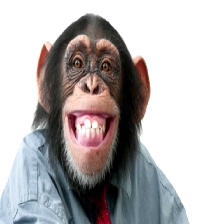

['marble', 'not_rock', 'sandstone', 'shale']
not_rock


In [78]:
img_path = "/content/maxresdefault.jpg"
img = keras.utils.load_img(img_path, target_size=input_shape[0:2])
input_array = tf.keras.utils.img_to_array(img)

img.show()

prediction, label = reloaded(input_array)

label = [i.numpy().decode("utf-8") for i in label]

print(label)
print(label[prediction.numpy().argmax()])


In [79]:
!cp -r "/content/rock_resnet_model_91" "/content/drive/MyDrive"

In [ ]:
!cp -r "/content/drive/MyDrive/rock_resnet_model_91" "/content"